In [1]:
import os

import torch
import torch.nn as nn
import numpy as np
from tqdm import tqdm

import matplotlib.pyplot as plt
import cv2

# Implementation and Training of VideoColorizer UNet model

With or without optical flow as specified


Inputs:
- previous frame: L, ab channels
- (optional) optical flow: 2 channels (x,y - np.array)
- current frame: L channel

Outputs:
- current frame: ab channels

TBD:
- split into train and test/val sets

In [2]:
from format_transforms import *

## 1. Data Loading

using the pytorch dataloader and dataset implementation from DataLoad.py

In [3]:
from DataLoad import CustomImageDataset, data_to_images, images_to_data

In [4]:
use_flow=True

train_dataset = CustomImageDataset(resolution='176p', use_flow=use_flow, test=False)
test_dataset = CustomImageDataset(resolution='176p', use_flow=use_flow, test=True)

dataset_size = len(train_dataset)
print('Dataset size:', dataset_size)

vid labels: ['bear', 'bike-packing', 'blackswan', 'bmx-bumps', 'bmx-trees', 'boat', 'boxing-fisheye', 'breakdance', 'breakdance-flare', 'bus', 'camel', 'car-roundabout', 'car-shadow', 'car-turn', 'cat-girl', 'classic-car', 'color-run', 'cows', 'crossing', 'dance-jump', 'dance-twirl', 'dancing', 'disc-jockey', 'dog', 'dog-agility', 'dog-gooses', 'dogs-jump', 'dogs-scale', 'drift-chicane', 'drift-straight', 'drift-turn', 'drone', 'elephant', 'flamingo', 'goat', 'gold-fish', 'hike', 'hockey', 'horsejump-high', 'horsejump-low', 'india', 'judo', 'kid-football', 'kite-surf', 'kite-walk', 'koala', 'lab-coat', 'lady-running', 'libby', 'lindy-hop', 'loading', 'longboard', 'lucia', 'mallard-fly', 'mallard-water', 'mbike-trick', 'miami-surf', 'motocross-bumps', 'motocross-jump', 'motorbike', 'night-race', 'paragliding', 'paragliding-launch', 'parkour', 'pigs', 'planes-water', 'rallye', 'rhino', 'rollerblade', 'schoolgirls', 'scooter-black', 'scooter-board', 'scooter-gray', 'sheep', 'shooting', 's

In [5]:
from torch.utils.data import DataLoader

train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=64, shuffle=True)

Feature batch shape: torch.Size([64, 6, 320, 176])
Labels batch shape: torch.Size([64, 2, 320, 176])


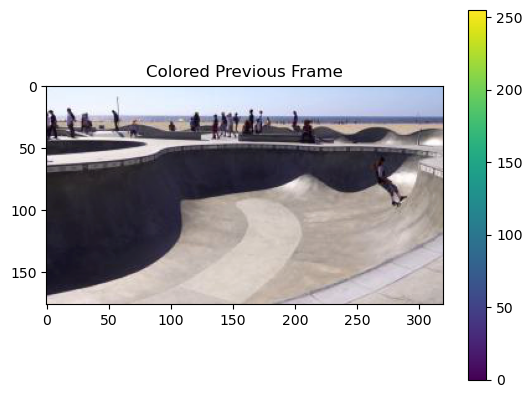

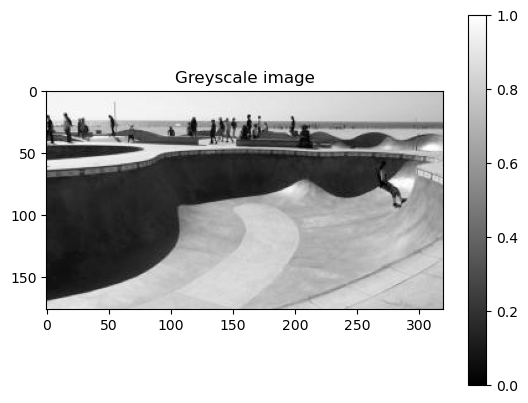

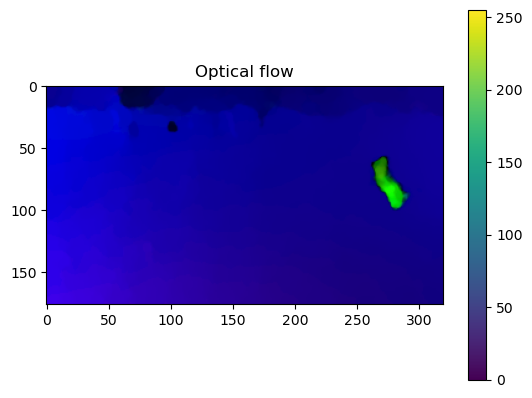

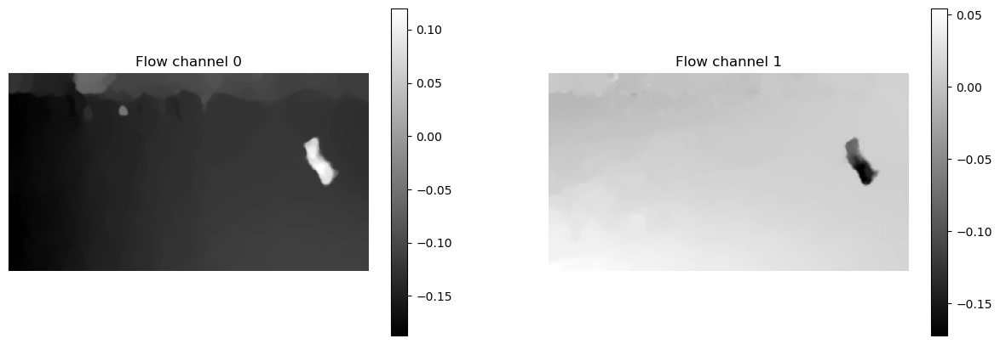

In [15]:
train_features, train_labels = next(iter(train_dataloader))

print(f"Feature batch shape: {train_features.size()}")
print(f"Labels batch shape: {train_labels.size()}")

col_img, flow_img, grey_img = data_to_images(train_features[0], train_labels[0], use_flow=use_flow, input_only=True)

im = plt.imshow(col_img)
cbar = plt.colorbar(im)
plt.title('Colored Previous Frame')
plt.show()

im = plt.imshow(grey_img, cmap='gray')
cbar = plt.colorbar(im)
plt.title('Greyscale image')
plt.show()


if use_flow:
    flow_rgb = uv_2_rgb(flow_img)

    im = plt.imshow(flow_rgb)
    cbar = plt.colorbar(im)
    plt.title('Optical flow')
    plt.show()

    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    for ax in enumerate(axs):
        ax[1].axis('off')
        ax[1].set_title('Flow channel ' + str(ax[0]))
        im = ax[1].imshow(flow_img[:, :, ax[0]], cmap='gray')
        cbar = fig.colorbar(im, ax=ax[1])
        
    plt.show()

## 2. Model Definition

In [16]:
from Model_UNet import UNet

print("Cuda available: ", torch.cuda.is_available())

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device: ", device)

Cuda available:  True
Using device:  cuda


In [17]:
#initialize model
if use_flow:
    n_input_channels = 6
else:
    n_input_channels = 4

model = UNet(n_input_channels=n_input_channels)
model.to(device)

# Hyperparameters
learning_rate = 5e-5
batch_size = 16
epochs = 300

# Initialize the loss function
loss_fn = nn.MSELoss()

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

# Data loader
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

In [18]:
model_path = '~/Documents/Colorization/Models/'
UNet_folder = 'UNet'
model_path = os.path.expanduser(model_path)
UNet_folder = os.path.join(model_path, UNet_folder)

def checkpoint(model, filename):
    filename = os.path.join(UNet_folder, filename)
    torch.save(model.state_dict(), filename)
    
def resume(model, filename):
    filename = os.path.join(UNet_folder, filename)
    model.load_state_dict(torch.load(filename))

In [19]:
def train_loop(dataloader, model, loss_fn, optimizer, verbose=False):
    size = len(dataloader.dataset)
    # Set the model to training mode - important for batch normalization and dropout layers
    # Unnecessary in this situation but added for best practices
    model.train()
    loss_sum = 0
    for batch, (X, y) in tqdm(enumerate(dataloader)):
        if verbose:
            print('batch No:', batch)
            print('X shape:', X.shape)
            print('y shape:', y.shape)
        
        # Compute prediction and loss
        if torch.cuda.is_available():
            X, y = X.to(device), y.to(device)
        pred = model(X)
        loss = loss_fn(pred, y)

        # Backpropagation
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        loss_sum += loss.item()
    loss_avg = loss_sum / size
    return loss_avg

In [20]:
epochs = 150
model_folder = 'UNet_DeepFlow_'+str(epochs)+'_epochs'
checkpoint_path = os.path.join(UNet_folder, model_folder)
print('Checkpoint path:', checkpoint_path)
make_dir(checkpoint_path)

save_model = True
loss_arr = []
test_limit = 500
train_len = len(train_dataloader.dataset)
test_len = len(test_dataloader.dataset)

for t in range(epochs):
    print(f"Epoch {t+1}\n-------------------------------")

    # Train the model
    loss_i_train = train_loop(train_dataloader, model, loss_fn, optimizer)
    print(f"Training Error: {loss_i_train}")
    loss_arr.append(loss_i_train)

    # Save model checkpoint
    if (t+1) % 5 == 0 and save_model:
        filename = 'UNet_DeepFlow_epoch_' + str(t+1) + '.pth'
        checkpoint(model, os.path.join(model_folder, filename))


    # Test the model
    running_tst_loss = 0
    with torch.no_grad():
        for i, (X, y) in enumerate(train_dataloader):
            # Compute prediction and loss
            if torch.cuda.is_available():
                X, y = X.to(device), y.to(device)
            pred = model(X)
            loss = loss_fn(pred, y)
            running_tst_loss += loss.item()
    avg_tst_loss = running_tst_loss / test_len
    print(f"Test Error: {avg_tst_loss}")

print("Done!")

Checkpoint path: /home/jansp/Documents/Colorization/Models/UNet/UNet_DeepFlow_150_epochs
Epoch 1
-------------------------------


383it [02:29,  2.56it/s]


Training Error: 0.0011428782395613887
Test Error: 0.0001591474337652067
Epoch 2
-------------------------------


383it [02:24,  2.65it/s]


Training Error: 4.9704283572121145e-05
Test Error: 4.068690125643992e-05
Epoch 3
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 2.758601484044652e-05
Test Error: 3.681755096530887e-05
Epoch 4
-------------------------------


383it [02:27,  2.60it/s]


Training Error: 2.5180283699715317e-05
Test Error: 3.4311998502676874e-05
Epoch 5
-------------------------------


383it [02:27,  2.59it/s]


Training Error: 2.4205067958186516e-05
Test Error: 3.3551568446489035e-05
Epoch 6
-------------------------------


383it [02:28,  2.59it/s]


Training Error: 2.3618376170366944e-05
Test Error: 3.315042122604036e-05
Epoch 7
-------------------------------


383it [02:27,  2.60it/s]


Training Error: 2.3034633167141157e-05
Test Error: 3.205127221479887e-05
Epoch 8
-------------------------------


383it [02:27,  2.59it/s]


Training Error: 2.275308723290959e-05
Test Error: 3.150316240323634e-05
Epoch 9
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 2.2212382908039775e-05
Test Error: 3.289140986790126e-05
Epoch 10
-------------------------------


383it [02:30,  2.54it/s]


Training Error: 2.1752844075046296e-05
Test Error: 3.0257793588572422e-05
Epoch 11
-------------------------------


383it [02:32,  2.51it/s]


Training Error: 2.1535538454218417e-05
Test Error: 2.9209010244812815e-05
Epoch 12
-------------------------------


383it [02:32,  2.52it/s]


Training Error: 2.0474367766412664e-05
Test Error: 2.815195859713842e-05
Epoch 13
-------------------------------


383it [02:28,  2.59it/s]


Training Error: 2.0160075395465313e-05
Test Error: 2.7159120903282505e-05
Epoch 14
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.952947916168992e-05
Test Error: 2.629771192409357e-05
Epoch 15
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.8608551308163403e-05
Test Error: 2.5213203453286378e-05
Epoch 16
-------------------------------


383it [02:27,  2.59it/s]


Training Error: 1.8073912859247677e-05
Test Error: 2.4860323990786262e-05
Epoch 17
-------------------------------


383it [02:23,  2.67it/s]


Training Error: 1.75932564143646e-05
Test Error: 2.53004529743824e-05
Epoch 18
-------------------------------


383it [02:23,  2.67it/s]


Training Error: 1.699744408047734e-05
Test Error: 2.3309894422035778e-05
Epoch 19
-------------------------------


383it [02:23,  2.67it/s]


Training Error: 1.6909291222961738e-05
Test Error: 2.3094006706338e-05
Epoch 20
-------------------------------


383it [02:24,  2.65it/s]


Training Error: 1.6386015353292112e-05
Test Error: 2.3073827797917247e-05
Epoch 21
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.6211582681203117e-05
Test Error: 2.2392664095605142e-05
Epoch 22
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.5776291180324175e-05
Test Error: 2.170049496675751e-05
Epoch 23
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.5376415631472232e-05
Test Error: 2.114002822963812e-05
Epoch 24
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.5317340565333278e-05
Test Error: 2.10871899795435e-05
Epoch 25
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.5021582666499709e-05
Test Error: 2.0290559152474292e-05
Epoch 26
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.4531230433678027e-05
Test Error: 2.0182895608471612e-05
Epoch 27
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.461138222696142e-05
Test Error: 1.967423712374983e-05
Epoch 28
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.4174241039225858e-05
Test Error: 1.952429794006026e-05
Epoch 29
-------------------------------


383it [02:27,  2.59it/s]


Training Error: 1.390621394960069e-05
Test Error: 1.9120194454242462e-05
Epoch 30
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.3819130673314892e-05
Test Error: 1.8508150801439857e-05
Epoch 31
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.3555379104308831e-05
Test Error: 1.9508089870349203e-05
Epoch 32
-------------------------------


383it [02:28,  2.57it/s]


Training Error: 1.3097100579441272e-05
Test Error: 1.8164141307284742e-05
Epoch 33
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.3059589164703369e-05
Test Error: 1.8347482342438457e-05
Epoch 34
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.2842232835755067e-05
Test Error: 1.74746229782209e-05
Epoch 35
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.2666878344552929e-05
Test Error: 1.7492224686874478e-05
Epoch 36
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.2492522731253341e-05
Test Error: 1.731233288848199e-05
Epoch 37
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.2843675309217962e-05
Test Error: 1.6803862276733358e-05
Epoch 38
-------------------------------


383it [02:29,  2.57it/s]


Training Error: 1.2234147417039911e-05
Test Error: 1.679898212353658e-05
Epoch 39
-------------------------------


383it [02:28,  2.57it/s]


Training Error: 1.20057232005894e-05
Test Error: 1.656598369495273e-05
Epoch 40
-------------------------------


383it [02:29,  2.57it/s]


Training Error: 1.1963659512446435e-05
Test Error: 1.7247976425264993e-05
Epoch 41
-------------------------------


383it [02:29,  2.57it/s]


Training Error: 1.1762251698454016e-05
Test Error: 1.588367514428952e-05
Epoch 42
-------------------------------


383it [02:29,  2.56it/s]


Training Error: 1.1667262077394033e-05
Test Error: 1.6184307211612272e-05
Epoch 43
-------------------------------


383it [02:29,  2.57it/s]


Training Error: 1.1379162045457528e-05
Test Error: 1.5510793922725565e-05
Epoch 44
-------------------------------


383it [02:29,  2.57it/s]


Training Error: 1.1319115162079566e-05
Test Error: 1.5958948870320457e-05
Epoch 45
-------------------------------


383it [02:29,  2.56it/s]


Training Error: 1.119528856980657e-05
Test Error: 1.6076312498693436e-05
Epoch 46
-------------------------------


383it [02:29,  2.56it/s]


Training Error: 1.1055155363681764e-05
Test Error: 1.7846077574816903e-05
Epoch 47
-------------------------------


383it [02:29,  2.56it/s]


Training Error: 1.1096949481044008e-05
Test Error: 1.544456589457426e-05
Epoch 48
-------------------------------


383it [02:29,  2.57it/s]


Training Error: 1.0724944360581238e-05
Test Error: 1.5428998107449e-05
Epoch 49
-------------------------------


383it [02:29,  2.57it/s]


Training Error: 1.0914452499311571e-05
Test Error: 1.9024217056506096e-05
Epoch 50
-------------------------------


383it [02:29,  2.56it/s]


Training Error: 1.0552189460335312e-05
Test Error: 1.4436999617828405e-05
Epoch 51
-------------------------------


383it [02:29,  2.57it/s]


Training Error: 1.0336554305661127e-05
Test Error: 1.4248086096847179e-05
Epoch 52
-------------------------------


383it [02:29,  2.56it/s]


Training Error: 1.0456868072020056e-05
Test Error: 1.4031556938115736e-05
Epoch 53
-------------------------------


383it [02:29,  2.57it/s]


Training Error: 1.0296347375777856e-05
Test Error: 1.4862535012812091e-05
Epoch 54
-------------------------------


383it [02:28,  2.58it/s]


Training Error: 1.0003255137829438e-05
Test Error: 1.3696309790450161e-05
Epoch 55
-------------------------------


383it [02:24,  2.66it/s]


Training Error: 9.708346580390003e-06
Test Error: 1.480134859506237e-05
Epoch 56
-------------------------------


383it [02:24,  2.66it/s]


Training Error: 1.0073328671366343e-05
Test Error: 1.4482533183750262e-05
Epoch 57
-------------------------------


383it [02:24,  2.65it/s]


Training Error: 9.462254082805902e-06
Test Error: 1.3819301262561499e-05
Epoch 58
-------------------------------


383it [02:24,  2.66it/s]


Training Error: 9.51105923407653e-06
Test Error: 1.3346904791399505e-05
Epoch 59
-------------------------------


383it [02:24,  2.65it/s]


Training Error: 9.320734344129324e-06
Test Error: 1.2834344060711036e-05
Epoch 60
-------------------------------


383it [02:24,  2.66it/s]


Training Error: 9.245519360632661e-06
Test Error: 1.3895139099312709e-05
Epoch 61
-------------------------------


383it [02:24,  2.66it/s]


Training Error: 9.209030279781621e-06
Test Error: 1.2746747121060185e-05
Epoch 62
-------------------------------


383it [02:24,  2.65it/s]


Training Error: 8.936186893918085e-06
Test Error: 1.282194613041712e-05
Epoch 63
-------------------------------


383it [02:24,  2.65it/s]


Training Error: 9.178889958360638e-06
Test Error: 1.2336890365447659e-05
Epoch 64
-------------------------------


383it [02:24,  2.65it/s]


Training Error: 8.775448213886572e-06
Test Error: 1.2002004388233656e-05
Epoch 65
-------------------------------


383it [02:24,  2.65it/s]


Training Error: 8.765398078011554e-06
Test Error: 1.2632342286956877e-05
Epoch 66
-------------------------------


383it [02:24,  2.66it/s]


Training Error: 8.705718820776404e-06
Test Error: 1.2952398726526924e-05
Epoch 67
-------------------------------


383it [02:23,  2.66it/s]


Training Error: 8.46994976653631e-06
Test Error: 1.1823625736387503e-05
Epoch 68
-------------------------------


383it [02:24,  2.64it/s]


Training Error: 8.334040615344804e-06
Test Error: 1.1591840252044172e-05
Epoch 69
-------------------------------


383it [02:24,  2.64it/s]


Training Error: 8.258131939813375e-06
Test Error: 1.2020328762850518e-05
Epoch 70
-------------------------------


383it [02:25,  2.64it/s]


Training Error: 8.368578901119458e-06
Test Error: 1.1109707348724542e-05
Epoch 71
-------------------------------


383it [02:25,  2.64it/s]


Training Error: 8.000045928758687e-06
Test Error: 1.1166960590950719e-05
Epoch 72
-------------------------------


383it [02:25,  2.64it/s]


Training Error: 8.12338084088189e-06
Test Error: 1.2844301803246102e-05
Epoch 73
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 8.053091185953454e-06
Test Error: 1.124424576556959e-05
Epoch 74
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 7.909772484001194e-06
Test Error: 1.0946864874852138e-05
Epoch 75
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 7.855680372538052e-06
Test Error: 1.1167048638459097e-05
Epoch 76
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 7.799230395317268e-06
Test Error: 1.1406764067740166e-05
Epoch 77
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 7.844167000913766e-06
Test Error: 1.0487255905934069e-05
Epoch 78
-------------------------------


383it [02:25,  2.64it/s]


Training Error: 7.510335089201901e-06
Test Error: 1.0830261944479221e-05
Epoch 79
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 7.465802487752383e-06
Test Error: 1.078070871177193e-05
Epoch 80
-------------------------------


383it [02:25,  2.64it/s]


Training Error: 7.609450301318635e-06
Test Error: 1.0162914601029047e-05
Epoch 81
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 7.370159279241267e-06
Test Error: 1.0084736247032804e-05
Epoch 82
-------------------------------


383it [02:25,  2.64it/s]


Training Error: 7.616210279605848e-06
Test Error: 1.0429217115449352e-05
Epoch 83
-------------------------------


383it [02:25,  2.64it/s]


Training Error: 7.241775290185407e-06
Test Error: 1.0137222628785552e-05
Epoch 84
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 7.120998229187691e-06
Test Error: 1.012228881673191e-05
Epoch 85
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 7.120539820072585e-06
Test Error: 1.0658301620322972e-05
Epoch 86
-------------------------------


383it [02:25,  2.62it/s]


Training Error: 7.094812850977744e-06
Test Error: 9.720585382166502e-06
Epoch 87
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 7.06229872222118e-06
Test Error: 9.747322248451248e-06
Epoch 88
-------------------------------


383it [02:26,  2.62it/s]


Training Error: 7.025928475668396e-06
Test Error: 9.793913068278926e-06
Epoch 89
-------------------------------


383it [02:26,  2.62it/s]


Training Error: 6.952783641852265e-06
Test Error: 9.617607081593263e-06
Epoch 90
-------------------------------


383it [02:26,  2.61it/s]


Training Error: 6.918256449593894e-06
Test Error: 9.56903290730056e-06
Epoch 91
-------------------------------


383it [02:26,  2.62it/s]


Training Error: 6.865496736273459e-06
Test Error: 1.0367090145438043e-05
Epoch 92
-------------------------------


383it [02:26,  2.62it/s]


Training Error: 6.888461239639103e-06
Test Error: 9.240327374384462e-06
Epoch 93
-------------------------------


383it [02:26,  2.61it/s]


Training Error: 6.701844670287972e-06
Test Error: 9.242335475526623e-06
Epoch 94
-------------------------------


383it [02:26,  2.62it/s]


Training Error: 6.6576048619118125e-06
Test Error: 9.321986883353222e-06
Epoch 95
-------------------------------


383it [02:26,  2.62it/s]


Training Error: 6.6077970556151616e-06
Test Error: 9.20788943993237e-06
Epoch 96
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 6.531953025266479e-06
Test Error: 9.004014770686843e-06
Epoch 97
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 6.582340221609947e-06
Test Error: 9.060149009369693e-06
Epoch 98
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 6.48203294944536e-06
Test Error: 9.018825692321655e-06
Epoch 99
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 6.539379232951446e-06
Test Error: 9.280697471930816e-06
Epoch 100
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 6.523277674328108e-06
Test Error: 9.705848772143697e-06
Epoch 101
-------------------------------


383it [02:25,  2.62it/s]


Training Error: 6.375024737954632e-06
Test Error: 8.876162234661966e-06
Epoch 102
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 6.304307269681531e-06
Test Error: 8.751903737902467e-06
Epoch 103
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 6.233553010727362e-06
Test Error: 8.705467556595707e-06
Epoch 104
-------------------------------


383it [02:25,  2.64it/s]


Training Error: 6.188500035001322e-06
Test Error: 8.635426446643476e-06
Epoch 105
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 6.15309307326553e-06
Test Error: 8.724297187520144e-06
Epoch 106
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 6.171244275570844e-06
Test Error: 8.436911368200391e-06
Epoch 107
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 6.111329958998912e-06
Test Error: 8.82127845266546e-06
Epoch 108
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 6.093737936275608e-06
Test Error: 8.416336895270096e-06
Epoch 109
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.978526688508265e-06
Test Error: 8.745534732615514e-06
Epoch 110
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.986031810244801e-06
Test Error: 8.272041880748777e-06
Epoch 111
-------------------------------


383it [02:25,  2.64it/s]


Training Error: 6.079512827260148e-06
Test Error: 8.221954932970995e-06
Epoch 112
-------------------------------


383it [02:24,  2.64it/s]


Training Error: 5.922356603747859e-06
Test Error: 8.28051430811751e-06
Epoch 113
-------------------------------


383it [02:24,  2.64it/s]


Training Error: 5.793338043083342e-06
Test Error: 8.067847575485185e-06
Epoch 114
-------------------------------


383it [02:24,  2.65it/s]


Training Error: 5.944295523544685e-06
Test Error: 8.434681165925684e-06
Epoch 115
-------------------------------


383it [02:24,  2.64it/s]


Training Error: 6.076216189931404e-06
Test Error: 8.529681666981627e-06
Epoch 116
-------------------------------


383it [02:25,  2.64it/s]


Training Error: 5.683721621992263e-06
Test Error: 7.974816537204821e-06
Epoch 117
-------------------------------


383it [02:24,  2.64it/s]


Training Error: 5.732995735370789e-06
Test Error: 8.293286388531366e-06
Epoch 118
-------------------------------


383it [02:24,  2.65it/s]


Training Error: 5.672123155082395e-06
Test Error: 7.977125361085873e-06
Epoch 119
-------------------------------


383it [02:24,  2.64it/s]


Training Error: 5.655692727456271e-06
Test Error: 7.821986613870885e-06
Epoch 120
-------------------------------


383it [02:24,  2.64it/s]


Training Error: 5.672706682601678e-06
Test Error: 7.645302522447579e-06
Epoch 121
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.5897839666857535e-06
Test Error: 7.946962397100934e-06
Epoch 122
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.5994078691621185e-06
Test Error: 7.594810772052033e-06
Epoch 123
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.549783332440205e-06
Test Error: 7.796060523375033e-06
Epoch 124
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.442853083584553e-06
Test Error: 8.087651779667929e-06
Epoch 125
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.527025183581179e-06
Test Error: 7.66204395269462e-06
Epoch 126
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.484487952259914e-06
Test Error: 7.862958807857434e-06
Epoch 127
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.3620723165892815e-06
Test Error: 7.521063674984261e-06
Epoch 128
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.430448712795076e-06
Test Error: 7.345342351072759e-06
Epoch 129
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.31741693008453e-06
Test Error: 7.466015516136529e-06
Epoch 130
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.291070022166663e-06
Test Error: 7.368577434539879e-06
Epoch 131
-------------------------------


383it [02:26,  2.62it/s]


Training Error: 5.290917120617046e-06
Test Error: 7.338029513448419e-06
Epoch 132
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.240353911628124e-06
Test Error: 7.668972648389171e-06
Epoch 133
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.206651583790754e-06
Test Error: 7.410860709771643e-06
Epoch 134
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.217417081995024e-06
Test Error: 7.521191225721311e-06
Epoch 135
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.189339222809327e-06
Test Error: 7.841280939323446e-06
Epoch 136
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.143997756791009e-06
Test Error: 7.534840800097434e-06
Epoch 137
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 5.185891556437546e-06
Test Error: 7.634705448927654e-06
Epoch 138
-------------------------------


383it [02:25,  2.62it/s]


Training Error: 4.99950306124225e-06
Test Error: 7.011325199831238e-06
Epoch 139
-------------------------------


383it [02:26,  2.62it/s]


Training Error: 5.087473604167417e-06
Test Error: 7.040824754801212e-06
Epoch 140
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 4.967475242484023e-06
Test Error: 7.061239269508709e-06
Epoch 141
-------------------------------


383it [02:26,  2.62it/s]


Training Error: 5.027242435577614e-06
Test Error: 6.854881904574641e-06
Epoch 142
-------------------------------


383it [02:26,  2.62it/s]


Training Error: 4.882405504219007e-06
Test Error: 7.396989931967929e-06
Epoch 143
-------------------------------


383it [02:25,  2.62it/s]


Training Error: 4.990199686819223e-06
Test Error: 7.1769469185609425e-06
Epoch 144
-------------------------------


383it [02:25,  2.62it/s]


Training Error: 4.854593181213473e-06
Test Error: 7.432115984118826e-06
Epoch 145
-------------------------------


383it [02:26,  2.62it/s]


Training Error: 4.909600916284496e-06
Test Error: 6.910093155191269e-06
Epoch 146
-------------------------------


383it [02:26,  2.62it/s]


Training Error: 4.81776154344952e-06
Test Error: 6.734108380981154e-06
Epoch 147
-------------------------------


383it [02:25,  2.62it/s]


Training Error: 4.7950633802109745e-06
Test Error: 6.880916655265739e-06
Epoch 148
-------------------------------


383it [02:25,  2.62it/s]


Training Error: 4.752317653695988e-06
Test Error: 6.511257167100363e-06
Epoch 149
-------------------------------


383it [02:25,  2.62it/s]


Training Error: 4.790133154226361e-06
Test Error: 6.5892912811317795e-06
Epoch 150
-------------------------------


383it [02:25,  2.63it/s]


Training Error: 4.780211382275024e-06
Test Error: 7.6281045005965065e-06
Done!


In [21]:
np.save(os.path.join(UNet_folder, model_folder, 'loss_arr_train.npy'), loss_arr)
np.save(os.path.join(UNet_folder, model_folder, 'loss_arr_test.npy'), avg_tst_loss)

avg_tst_loss_ = avg_tst_loss
print(np.shape(avg_tst_loss_))

()


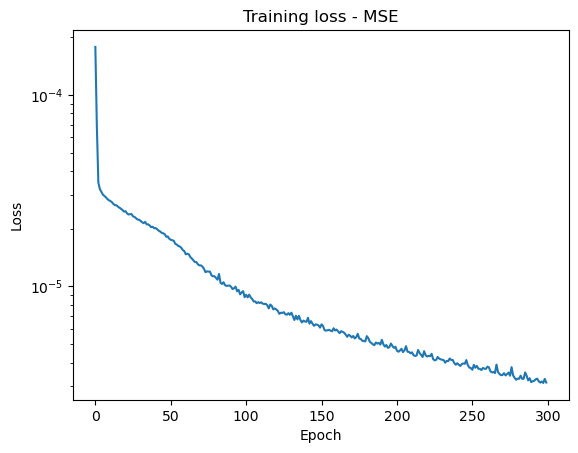

In [ ]:
plt.plot(loss_arr)
plt.title('Training loss - MSE')
plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.yscale('log')
plt.show()

Feature batch shape: torch.Size([16, 6, 320, 176])
Labels batch shape: torch.Size([16, 2, 320, 176])
torch.Size([16, 2, 320, 176])


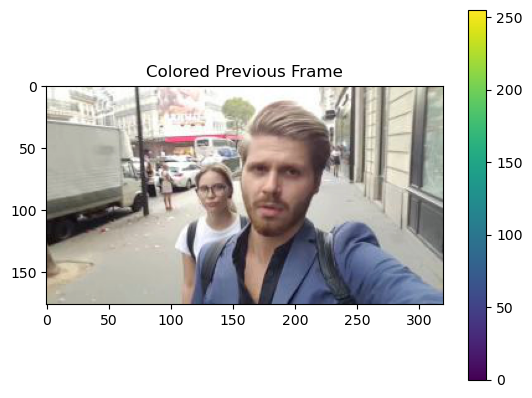

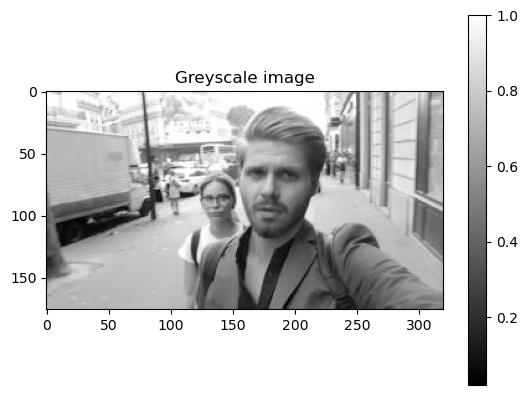

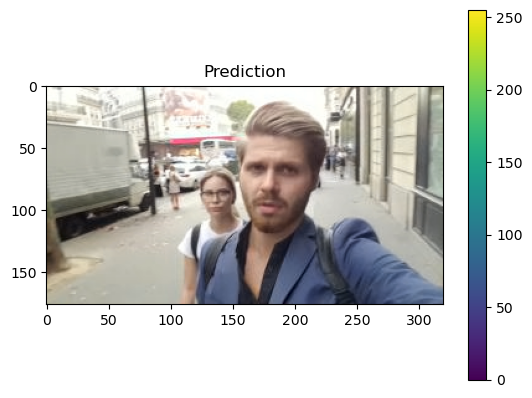

In [18]:
train_features, train_labels = next(iter(train_dataloader))

print(f"Feature batch shape: {train_features.size()}")
print(f"Labels batch shape: {train_labels.size()}")

prediction = model(train_features.to(device))
prediction = prediction.cpu()
prediction = prediction.detach()
#prediction = prediction.numpy()
print(prediction.shape)


col_img, flow_img, grey_img, pred_img = data_to_images(train_features[0], prediction[0], use_flow=use_flow, input_only=False)

im = plt.imshow(col_img)
cbar = plt.colorbar(im)
plt.title('Colored Previous Frame')
plt.show()

im = plt.imshow(grey_img, cmap='gray')
cbar = plt.colorbar(im)
plt.title('Greyscale image')
plt.show()

im = plt.imshow(pred_img)
cbar = plt.colorbar(im)
plt.title('Prediction')
plt.show()


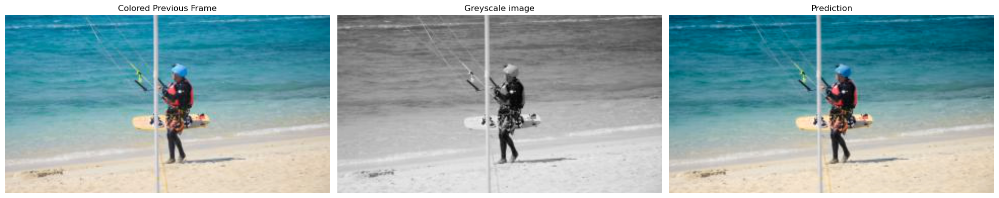

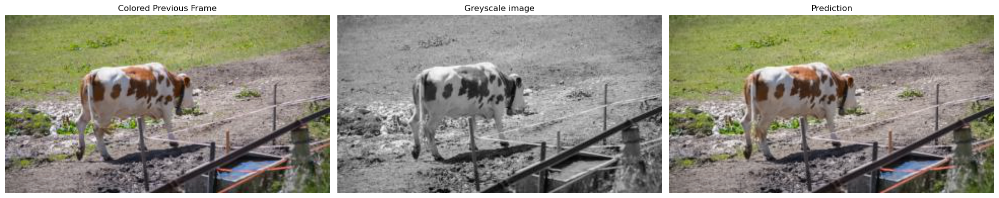

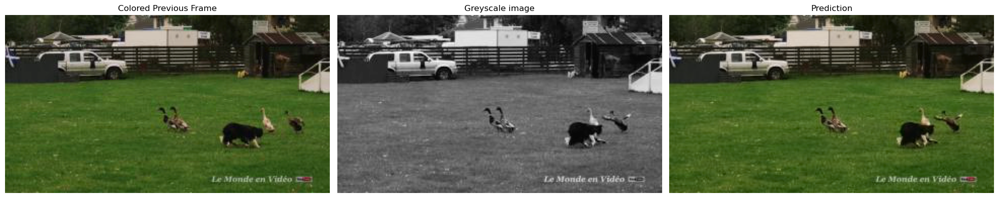

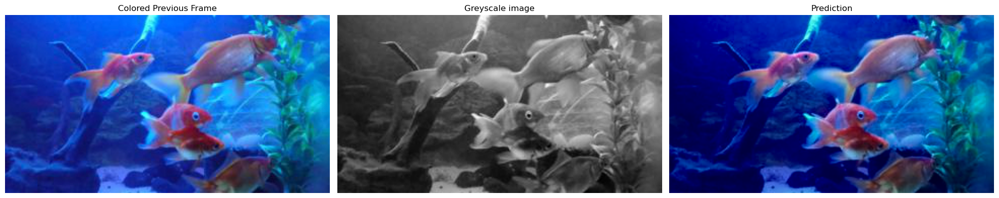

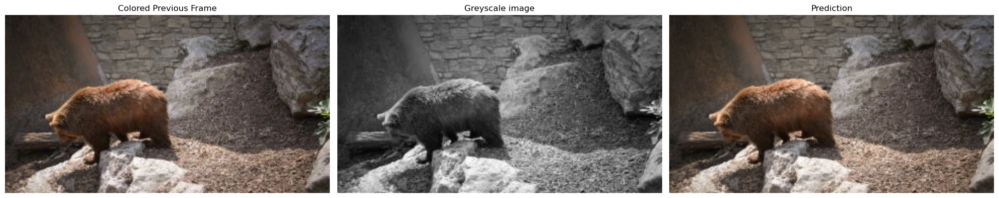

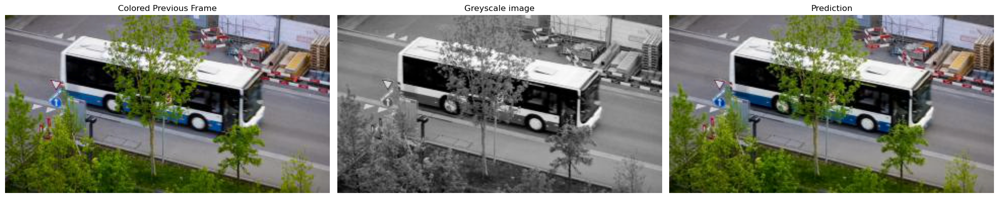

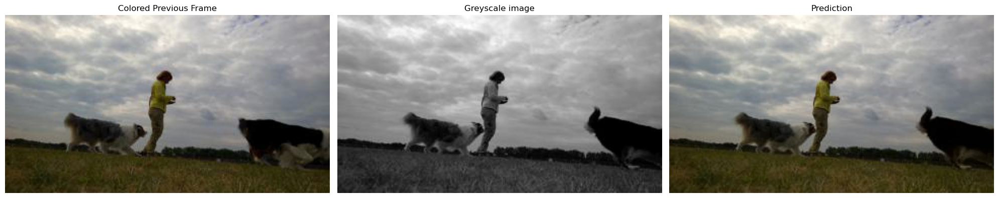

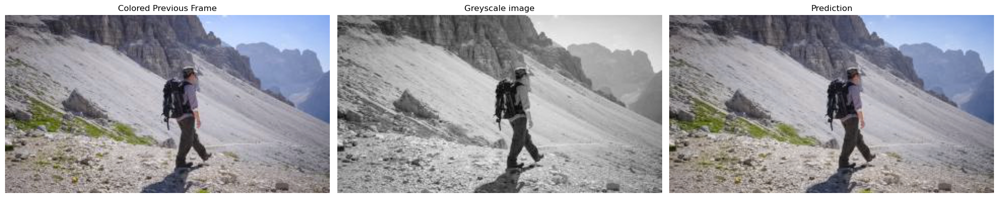

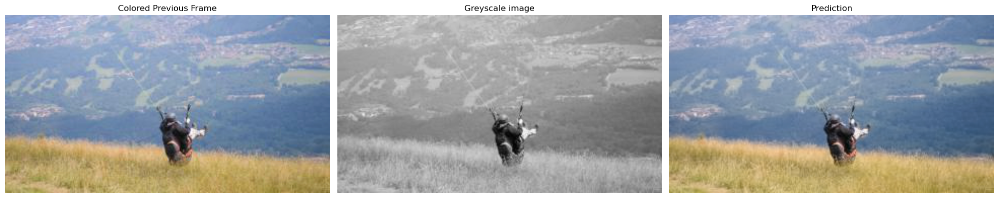

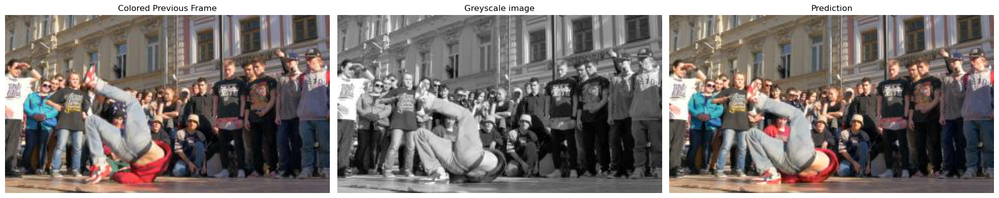

In [19]:
train_features, train_labels = next(iter(train_dataloader))

prediction = model(train_features.to(device))
prediction = prediction.cpu()
prediction = prediction.detach()

for i in range(10):
    col_img, flow_img, grey_img, pred_img = data_to_images(train_features[i], prediction[i], use_flow=use_flow, input_only=False)

    fig, axs = plt.subplots(1, 3, figsize=(20, 5))

    axs[0].imshow(col_img)
    axs[0].axis('off')
    axs[0].set_title('Colored Previous Frame')

    axs[1].imshow(grey_img, cmap='gray')
    axs[1].axis('off')
    axs[1].set_title('Greyscale image')

    """
    axs[2].imshow(uv_2_rgb(flow_img))
    axs[2].axis('off')
    axs[2].set_title('Optical flow')
    """

    axs[2].imshow(pred_img)
    axs[2].axis('off')
    axs[2].set_title('Prediction')

    plt.tight_layout()
    plt.show()